Starting simulation for 1000 time units

            Driver Arrival:
            - Time: 1.3724333248271137
            - Driver ID: D592
            - Type: UberGreen
            - Location: (6, 5)
            - Active Drivers: 11
            

        Shift Scheduled:
        - Driver: D592
        - Duration: 6.65 hours
        - End Time: 23958.0227495333
        

Starting Queue Matching Process:
Main Queue Size: 15
Secondary Queue Size: 85
Available Drivers: 11

Processing Main Queue:
Initial queue size: 15
Available drivers: 11
Match found - Client: C8786, Driver: D582, Score: 0.880
Client C8786 not found in any queue

        Match Created:
        - Time: 1.3724333248271137
        - Client: C8786 (Premium)
        - Driver: D582 (UberGreen)
        - Pickup Route: (8, 8) -> (8, 8)
        
Match found - Client: C8787, Driver: D583, Score: 0.801
Client C8787 not found in any queue

        Match Created:
        - Time: 1.3724333248271137
        - Client: C8787 (Premium)
    

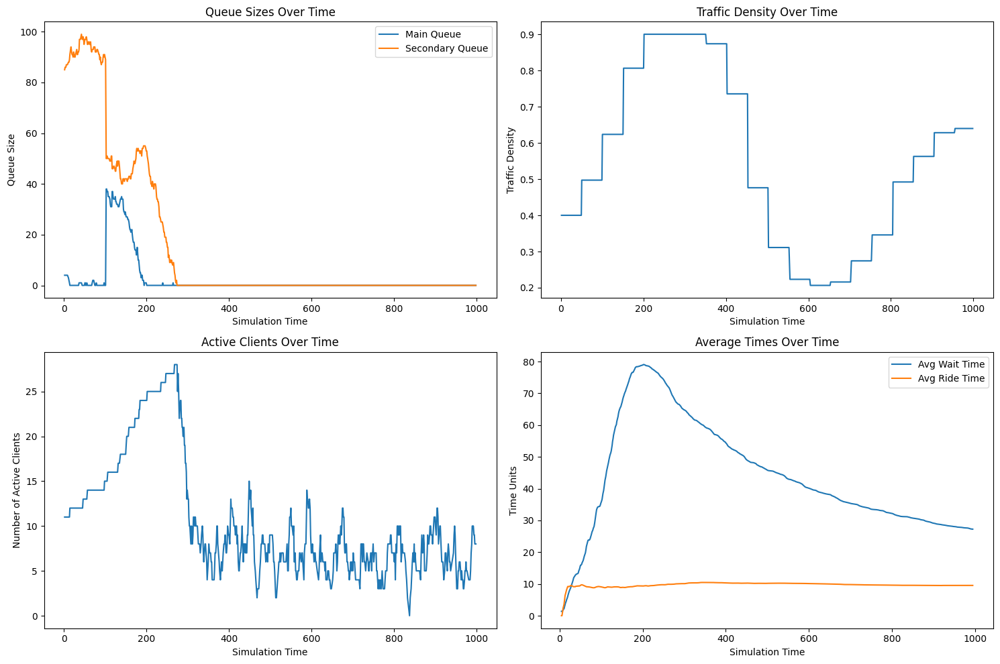

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

from uber_network import uber_network
from map import city_map
from rider import uber_client

def run_and_plot_simulation(network):
    """
    Run the simulation using existing uber_network.run() and create plots
    
    Args:
        network (uber_network): Initialized uber_network instance
    """
    # Data collectors
    data = defaultdict(list)
    time_points = []
    last_collection_time = 0
    collection_interval = 1  # Collect data every simulation time unit
    
    # Store original event handlers
    original_handlers = {
        'client_arrival': network.handle_client_arrival,
        'driver_arrival': network.handle_driver_arrival,
        'pickup_start': network.handle_pickup_start,
        'pickup_end': network.handle_pickup_end,
        'ride_start': network.handle_ride_start,
        'ride_end': network.handle_ride_end,
        'driver_shift_end': network.handle_driver_shift_end
    }
    
    def collect_data():
        if network.current_time - last_collection_time >= collection_interval:
            time_points.append(network.current_time)
            queue_sizes = network.get_queue_sizes()
            data['main_queue'].append(queue_sizes['main_queue'])
            data['secondary_queue'].append(queue_sizes['secondary_queue'])
            
            # Get traffic density at center of map
            center_x, center_y = network.city_map.width // 2, network.city_map.height // 2
            traffic = network.city_map.get_traffic_density((center_x, center_y))
            data['traffic'].append(traffic)
            
            # Count active clients
            data['active_clients'].append(len(network.active_rides))
            
            # Calculate average wait and ride times
            if network.stats['total_matches'] > 0:
                avg_wait = network.stats['total_waiting_time'] / network.stats['total_matches']
                data['avg_wait'].append(avg_wait)
            else:
                data['avg_wait'].append(0)
                
            if network.stats['total_completed_rides'] > 0:
                avg_ride = network.stats['total_ride_time'] / network.stats['total_completed_rides']
                data['avg_ride'].append(avg_ride)
            else:
                data['avg_ride'].append(0)
            
            return True
        return False
    
    # Create wrapped handlers for all event types
    def wrap_handler(original_handler):
        def wrapped_handler(*args, **kwargs):
            nonlocal last_collection_time
            result = original_handler(*args, **kwargs)
            if collect_data():
                last_collection_time = network.current_time
            return result
        return wrapped_handler
    
    # Replace all handlers with wrapped versions
    network.handle_client_arrival = wrap_handler(original_handlers['client_arrival'])
    network.handle_driver_arrival = wrap_handler(original_handlers['driver_arrival'])
    network.handle_pickup_start = wrap_handler(original_handlers['pickup_start'])
    network.handle_pickup_end = wrap_handler(original_handlers['pickup_end'])
    network.handle_ride_start = wrap_handler(original_handlers['ride_start'])
    network.handle_ride_end = wrap_handler(original_handlers['ride_end'])
    network.handle_driver_shift_end = wrap_handler(original_handlers['driver_shift_end'])
    
    # Run simulation
    network.run()
    
    # Restore original handlers
    network.handle_client_arrival = original_handlers['client_arrival']
    network.handle_driver_arrival = original_handlers['driver_arrival']
    network.handle_pickup_start = original_handlers['pickup_start']
    network.handle_pickup_end = original_handlers['pickup_end']
    network.handle_ride_start = original_handlers['ride_start']
    network.handle_ride_end = original_handlers['ride_end']
    network.handle_driver_shift_end = original_handlers['driver_shift_end']
    
    # Create plots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
    
    # 1. Queue sizes over time
    ax1.plot(time_points, data['main_queue'], label='Main Queue')
    ax1.plot(time_points, data['secondary_queue'], label='Secondary Queue')
    ax1.set_title('Queue Sizes Over Time')
    ax1.set_xlabel('Simulation Time')
    ax1.set_ylabel('Queue Size')
    ax1.legend()
    
    # 2. Traffic density over time
    ax2.plot(time_points, data['traffic'])
    ax2.set_title('Traffic Density Over Time')
    ax2.set_xlabel('Simulation Time')
    ax2.set_ylabel('Traffic Density')
    
    # 3. Active clients over time
    ax3.plot(time_points, data['active_clients'])
    ax3.set_title('Active Clients Over Time')
    ax3.set_xlabel('Simulation Time')
    ax3.set_ylabel('Number of Active Clients')
    
    # 4. Average wait and ride times
    def moving_average(data, window=5):
        return np.convolve(data, np.ones(window)/window, mode='valid')
    
    # Only plot non-zero values
    wait_times = np.array(data['avg_wait'])
    ride_times = np.array(data['avg_ride'])
    
    # Apply moving average if we have enough data points
    if len(wait_times) > 5:
        smoothed_wait = moving_average(wait_times)
        smoothed_ride = moving_average(ride_times)
        # Adjust time points for the moving average window
        plot_times = time_points[2:-2]
        ax4.plot(plot_times, smoothed_wait, label='Avg Wait Time')
        ax4.plot(plot_times, smoothed_ride, label='Avg Ride Time')
    else:
        ax4.plot(time_points, wait_times, label='Avg Wait Time')
        ax4.plot(time_points, ride_times, label='Avg Ride Time')
    
    ax4.set_title('Average Times Over Time')
    ax4.set_xlabel('Simulation Time')
    ax4.set_ylabel('Time Units')
    ax4.legend()
    
    plt.tight_layout()
    plt.show()
    
    return data, time_points

# First create the map and network as before
my_map = city_map((10, 10), num_hotspots=3)
my_network = uber_network(
    city_map=my_map,
    client_arrival_rate=0.3,
    driver_arrival_rate=0.08,
    pre_simulation_driver=10,
    simulation_time=1000
)

# Pre-load some clients into queues before starting simulation
num_initial_clients = 100  # Adjust this number as needed

# Generate and add initial clients
for _ in range(num_initial_clients):
    # Create new client at time 0
    new_client = uber_client.generate_client(my_map, current_time=0)
    
    # Add to appropriate queue based on client type
    if new_client.behaviour_type == "Premium":
        my_network.main_queue.put(new_client)
    else:
        my_network.secondary_queue.put(new_client)
    
    # Update network stats
    my_network.stats['total_clients'] += 1

# Now run simulation and plot
data, time_points = run_and_plot_simulation(my_network)

Starting simulation for 1000 time units
Scheduling next client arrival at time: 5.90
Client C7735 added to secondary queue
Attempting to match - Available drivers: 10

Starting Queue Matching Process:
Main Queue Size: 2
Secondary Queue Size: 24
Available Drivers: 10

Processing Main Queue:
Initial queue size: 2
Available drivers: 10
Match found - Client: C7737, Driver: D542, Score: 0.975
Client C7737 not found in any queue

        Match Created:
        - Time: 1.0151285660868112
        - Client: C7737 (Premium)
        - Driver: D542 (UberLux)
        - Pickup Route: (5, 8) -> (1, 8)
        
Match found - Client: C7746, Driver: D541, Score: 0.862
Client C7746 not found in any queue

        Match Created:
        - Time: 1.0151285660868112
        - Client: C7746 (Premium)
        - Driver: D541 (UberX)
        - Pickup Route: (4, 7) -> (2, 8)
        
Queue processing complete - Matches made: 2

Processing Secondary Queue:
Initial queue size: 24
Available drivers: 8
Match found - 

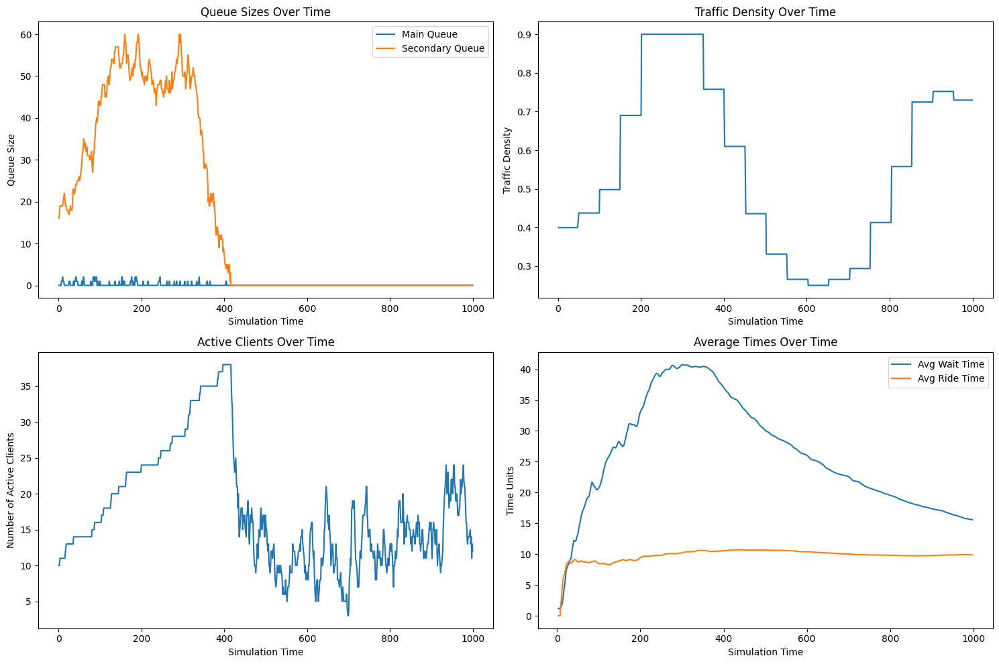

In [26]:
# First create the map and network as before
my_map = city_map((10, 10), num_hotspots=4)
my_network = uber_network(
    city_map=my_map,
    client_arrival_rate=0.5,
    driver_arrival_rate=0.08,
    pre_simulation_driver=10,
    simulation_time=1000
)

# Pre-load some clients into queues before starting simulation
num_initial_clients = 25  # Adjust this number as needed

# Generate and add initial clients
for _ in range(num_initial_clients):
    # Create new client at time 0
    new_client = uber_client.generate_client(my_map, current_time=0)
    
    # Add to appropriate queue based on client type
    if new_client.behaviour_type == "Premium":
        my_network.main_queue.put(new_client)
    else:
        my_network.secondary_queue.put(new_client)
    
    # Update network stats
    my_network.stats['total_clients'] += 1

# Now run simulation and plot
data, time_points = run_and_plot_simulation(my_network)

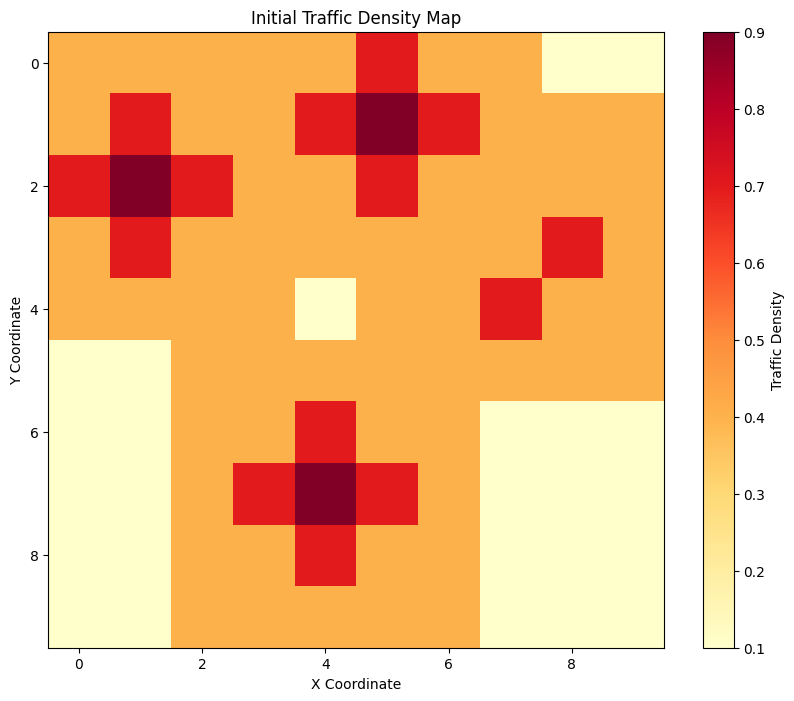

In [19]:
my_map = city_map((10, 10), num_hotspots=4)
# Visualize initial traffic conditions
plt.figure(figsize=(10, 8))
traffic_data = np.zeros((10,10))
for (x, y), density in my_map.get_all_traffic_data().items():
    traffic_data[x][y] = density

plt.imshow(traffic_data.T, cmap='YlOrRd', interpolation='nearest')
plt.colorbar(label='Traffic Density')
plt.title('Initial Traffic Density Map')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()

Starting simulation for 1000 time units
Scheduling next client arrival at time: 3.49
Client C9459 added to secondary queue
Attempting to match - Available drivers: 10

Starting Queue Matching Process:
Main Queue Size: 22
Secondary Queue Size: 79
Available Drivers: 10

Processing Main Queue:
Initial queue size: 22
Available drivers: 10
Match found - Client: C9460, Driver: D616, Score: 0.953
Client C9460 not found in any queue

        Match Created:
        - Time: 1.3809560757123183
        - Client: C9460 (Premium)
        - Driver: D616 (UberX)
        - Pickup Route: (7, 0) -> (9, 0)
        
Match found - Client: C9463, Driver: D615, Score: 0.865
Client C9463 not found in any queue

        Match Created:
        - Time: 1.3809560757123183
        - Client: C9463 (Premium)
        - Driver: D615 (UberX)
        - Pickup Route: (5, 2) -> (6, 3)
        
Match found - Client: C9469, Driver: D620, Score: 0.706
Client C9469 not found in any queue

        Match Created:
        - Time:

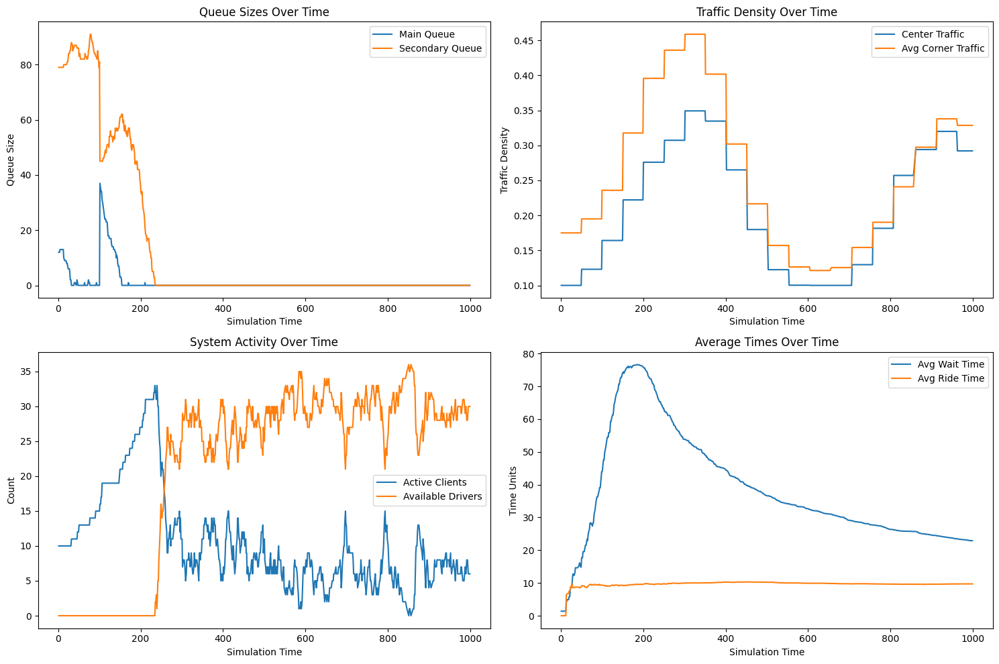

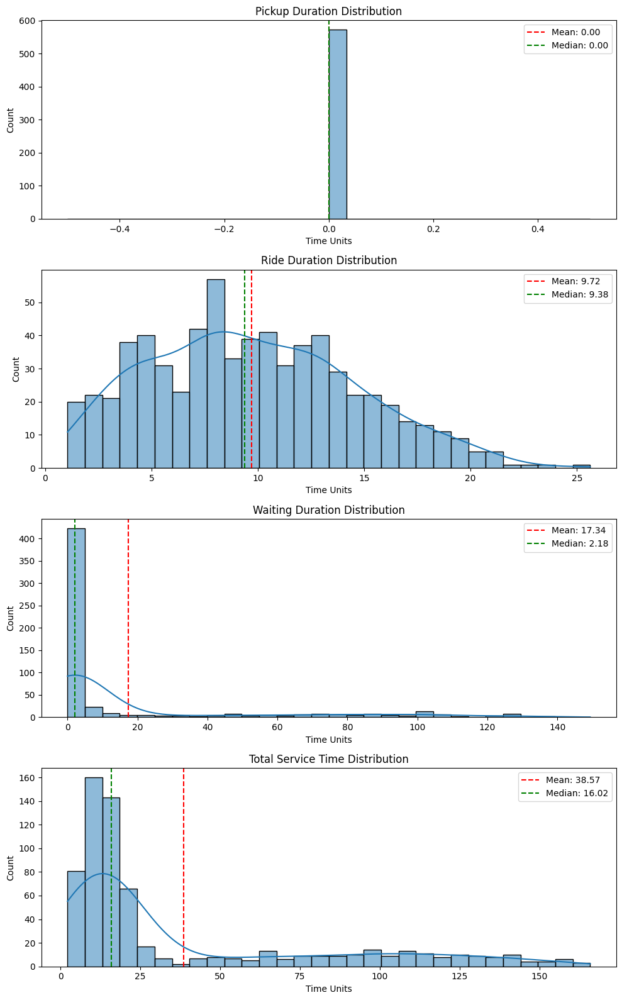

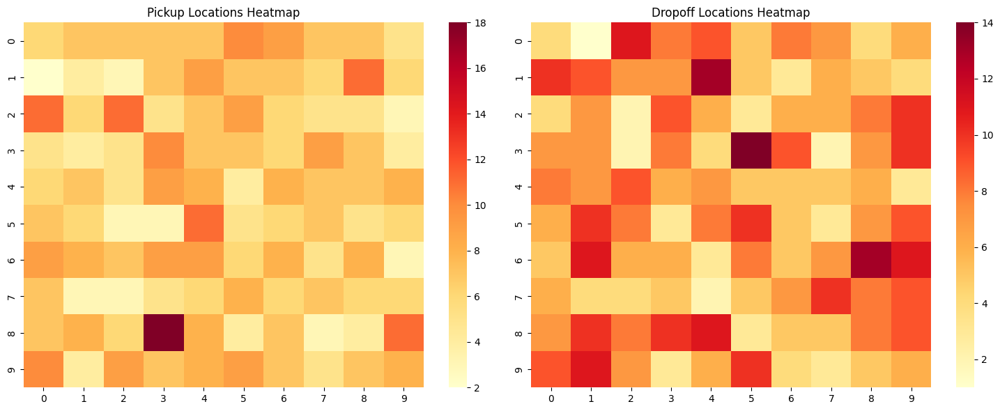

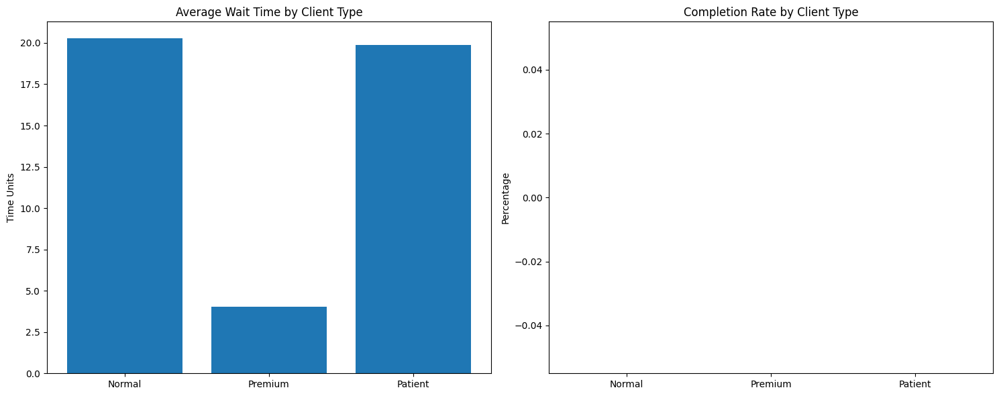


Event Timing Statistics:
{'pickup_duration': {'mean': 0.0, 'median': 0.0, 'std': 0.0, 'min': 0.0, 'max': 0.0}, 'ride_duration': {'mean': 9.716744861478603, 'median': 9.384399981882154, 'std': 4.8235800008688825, 'min': 1.0509714063007891, 'max': 25.62611657654122}, 'waiting_duration': {'mean': 17.338168431210985, 'median': 2.1825521301315405, 'std': 33.335665572496296, 'min': 0.0, 'max': 149.39723194648113}, 'total_service_time': {'mean': 38.56652128508977, 'median': 16.015818927098138, 'std': 43.11164875549911, 'min': 2.2235672260384263, 'max': 165.92364109965106}}

Client Type Statistics:
{'Normal': {'wait_times': [134.61924028089993, 124.63372695541523, 124.76397218401031, 119.70712088172354, 149.39723194648113, 122.08649890564091, 128.0836461266192, 126.415861807706, 104.7274650338878, 135.27442923099287, 101.1763895324423, 128.24022516531198, 100.4334035725791, 124.87282935679835, 128.22036509190468, 101.0904277137337, 93.53477144735854, 95.62480141509944, 129.4504015314928, 105.

In [28]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
from typing import Dict, List, Tuple
import seaborn as sns
from FES import EventType

def run_and_plot_simulation(network):
    """
    Run the simulation with comprehensive data collection and visualization
    
    Args:
        network (uber_network): Initialized uber_network instance
        
    Returns:
        tuple: (collected_data, time_points, analysis_results)
    """
    # Data collectors
    data = defaultdict(list)
    time_points = []
    last_collection_time = 0
    collection_interval = 1  # Collect data every simulation time unit
    
    # Event timing collectors
    event_timings = {
        'pickup_duration': [],     # Time between pickup_start and pickup_end
        'ride_duration': [],       # Time between ride_start and ride_end
        'waiting_duration': [],    # Time between client_arrival and pickup_start
        'total_service_time': []   # Total time from arrival to ride completion
    }
    
    # Client type analytics
    client_type_stats = {
        'Normal': {'wait_times': [], 'ride_times': [], 'total_clients': 0, 'completed_rides': 0},
        'Premium': {'wait_times': [], 'ride_times': [], 'total_clients': 0, 'completed_rides': 0},
        'Patient': {'wait_times': [], 'ride_times': [], 'total_clients': 0, 'completed_rides': 0}
    }
    
    # Driver analytics
    driver_stats = {
        'UberX': {'total_rides': 0, 'service_time': 0, 'total_time': 0},
        'UberGreen': {'total_rides': 0, 'service_time': 0, 'total_time': 0},
        'UberLux': {'total_rides': 0, 'service_time': 0, 'total_time': 0}
    }
    
    # Geographic data
    pickup_locations = []
    dropoff_locations = []
    
    # Matching analytics
    match_scores = []
    failed_matches = []
    
    # Store original event handlers
    original_handlers = {
        'client_arrival': network.handle_client_arrival,
        'driver_arrival': network.handle_driver_arrival,
        'pickup_start': network.handle_pickup_start,
        'pickup_end': network.handle_pickup_end,
        'ride_start': network.handle_ride_start,
        'ride_end': network.handle_ride_end,
        'driver_shift_end': network.handle_driver_shift_end
    }
    
    def collect_data():
        """Collect periodic simulation data"""
        if network.current_time - last_collection_time >= collection_interval:
            time_points.append(network.current_time)
            
            # Queue sizes
            queue_sizes = network.get_queue_sizes()
            data['main_queue'].append(queue_sizes['main_queue'])
            data['secondary_queue'].append(queue_sizes['secondary_queue'])
            
            # Traffic density at center and corners
            center = (network.city_map.width // 2, network.city_map.height // 2)
            corners = [(0,0), (0, network.city_map.height-1), 
                      (network.city_map.width-1, 0), 
                      (network.city_map.width-1, network.city_map.height-1)]
            
            data['center_traffic'].append(network.city_map.get_traffic_density(center))
            corner_traffic = [network.city_map.get_traffic_density(corner) for corner in corners]
            data['avg_corner_traffic'].append(np.mean(corner_traffic))
            
            # Active clients and drivers
            data['active_clients'].append(len(network.active_rides))
            data['available_drivers'].append(len(network.available_drivers))
            
            # Average times
            if network.stats['total_matches'] > 0:
                avg_wait = network.stats['total_waiting_time'] / network.stats['total_matches']
                data['avg_wait'].append(avg_wait)
            else:
                data['avg_wait'].append(0)
                
            if network.stats['total_completed_rides'] > 0:
                avg_ride = network.stats['total_ride_time'] / network.stats['total_completed_rides']
                data['avg_ride'].append(avg_ride)
            else:
                data['avg_ride'].append(0)
            
            return True
        return False
    
    def wrap_handler(original_handler):
        """Wrap event handlers with data collection"""
        def wrapped_handler(*args, **kwargs):
            event_start_time = network.current_time
            result = original_handler(*args, **kwargs)
            
            # Track event durations and other metrics
            if args and args[0]:  # If we have an event object
                event = args[0]
                
                if event.event_type == EventType.RIDE_END:
                    client = args[1]
                    driver = args[2]
                    if client and driver:
                        # Event timing
                        total_time = network.current_time - client.arrival_time
                        event_timings['total_service_time'].append(total_time)
                        
                        if client.pickup_time:
                            ride_time = network.current_time - client.pickup_time
                            event_timings['ride_duration'].append(ride_time)
                        
                        # Client type stats
                        client_type_stats[client.behaviour_type]['ride_times'].append(ride_time)
                        client_type_stats[client.behaviour_type]['completed_rides'] += 1
                        
                        # Driver stats
                        driver_stats[driver.behaviour_type]['total_rides'] += 1
                        driver_stats[driver.behaviour_type]['service_time'] += ride_time
                        
                        # Geographic data
                        dropoff_locations.append((client.destination.x, client.destination.y))
                
                elif event.event_type == EventType.DRIVER_PICKUP_START:
                    client = args[1]
                    if client:
                        pickup_locations.append((client.current_location.x, client.current_location.y))
                
                elif event.event_type == EventType.DRIVER_PICKUP_END:
                    client = args[1]
                    if client and client.arrival_time:
                        # Calculate waiting and pickup durations
                        wait_time = network.current_time - client.arrival_time
                        event_timings['waiting_duration'].append(wait_time)
                        
                        pickup_time = event_start_time - event.time
                        event_timings['pickup_duration'].append(pickup_time)
                        
                        # Client type waiting stats
                        client_type_stats[client.behaviour_type]['wait_times'].append(wait_time)
            
            if collect_data():
                nonlocal last_collection_time
                last_collection_time = network.current_time
            return result
        return wrapped_handler
    
    # Replace all handlers with wrapped versions
    for event_type, handler in original_handlers.items():
        setattr(network, f'handle_{event_type}', wrap_handler(handler))
    
    # Run simulation
    network.run()
    
    # Restore original handlers
    for event_type, handler in original_handlers.items():
        setattr(network, f'handle_{event_type}', handler)
    
    # Create visualization plots
    def plot_basic_metrics():
        """Plot basic simulation metrics"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
        
        # 1. Queue sizes
        ax1.plot(time_points, data['main_queue'], label='Main Queue')
        ax1.plot(time_points, data['secondary_queue'], label='Secondary Queue')
        ax1.set_title('Queue Sizes Over Time')
        ax1.set_xlabel('Simulation Time')
        ax1.set_ylabel('Queue Size')
        ax1.legend()
        
        # 2. Traffic density
        ax2.plot(time_points, data['center_traffic'], label='Center Traffic')
        ax2.plot(time_points, data['avg_corner_traffic'], label='Avg Corner Traffic')
        ax2.set_title('Traffic Density Over Time')
        ax2.set_xlabel('Simulation Time')
        ax2.set_ylabel('Traffic Density')
        ax2.legend()
        
        # 3. Active clients and available drivers
        ax3.plot(time_points, data['active_clients'], label='Active Clients')
        ax3.plot(time_points, data['available_drivers'], label='Available Drivers')
        ax3.set_title('System Activity Over Time')
        ax3.set_xlabel('Simulation Time')
        ax3.set_ylabel('Count')
        ax3.legend()
        
        # 4. Average wait and ride times
        ax4.plot(time_points, data['avg_wait'], label='Avg Wait Time')
        ax4.plot(time_points, data['avg_ride'], label='Avg Ride Time')
        ax4.set_title('Average Times Over Time')
        ax4.set_xlabel('Simulation Time')
        ax4.set_ylabel('Time Units')
        ax4.legend()
        
        plt.tight_layout()
        plt.show()
    
    def plot_event_distributions():
        """Plot event timing distributions"""
        num_events = len(event_timings)
        fig, axes = plt.subplots(num_events, 1, figsize=(10, 4*num_events))
        
        for idx, (event_type, timings) in enumerate(event_timings.items()):
            if timings:
                sns.histplot(timings, bins=30, kde=True, ax=axes[idx])
                axes[idx].set_title(f'{event_type.replace("_", " ").title()} Distribution')
                axes[idx].set_xlabel('Time Units')
                axes[idx].set_ylabel('Count')
                
                # Add statistics
                mean_val = np.mean(timings)
                median_val = np.median(timings)
                axes[idx].axvline(mean_val, color='r', linestyle='--', 
                                label=f'Mean: {mean_val:.2f}')
                axes[idx].axvline(median_val, color='g', linestyle='--',
                                label=f'Median: {median_val:.2f}')
                axes[idx].legend()
        
        plt.tight_layout()
        plt.show()
    
    def plot_geographic_heatmap():
        """Plot pickup and dropoff location heatmaps"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        # Pickup heatmap
        pickup_matrix = np.zeros((network.city_map.height, network.city_map.width))
        for x, y in pickup_locations:
            pickup_matrix[y, x] += 1
            
        sns.heatmap(pickup_matrix, ax=ax1, cmap='YlOrRd')
        ax1.set_title('Pickup Locations Heatmap')
        
        # Dropoff heatmap
        dropoff_matrix = np.zeros((network.city_map.height, network.city_map.width))
        for x, y in dropoff_locations:
            dropoff_matrix[y, x] += 1
            
        sns.heatmap(dropoff_matrix, ax=ax2, cmap='YlOrRd')
        ax2.set_title('Dropoff Locations Heatmap')
        
        plt.tight_layout()
        plt.show()
    
    def plot_client_type_analysis():
        """Plot client type performance metrics"""
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        # Prepare data
        client_types = list(client_type_stats.keys())
        wait_times = [np.mean(stats['wait_times']) if stats['wait_times'] else 0 
                     for stats in client_type_stats.values()]
        completion_rates = [stats['completed_rides']/stats['total_clients']*100 
                          if stats['total_clients'] > 0 else 0 
                          for stats in client_type_stats.values()]
        
        # Wait times by client type
        ax1.bar(client_types, wait_times)
        ax1.set_title('Average Wait Time by Client Type')
        ax1.set_ylabel('Time Units')
        
        # Completion rates by client type
        ax2.bar(client_types, completion_rates)
        ax2.set_title('Completion Rate by Client Type')
        ax2.set_ylabel('Percentage')
        
        plt.tight_layout()
        plt.show()
    
    # Generate all plots
    plot_basic_metrics()
    plot_event_distributions()
    plot_geographic_heatmap()
    plot_client_type_analysis()
    
    # Calculate final analytics
    analysis_results = {
        'event_timing_stats': {
            event_type: {
                'mean': np.mean(timings) if timings else 0,
                'median': np.median(timings) if timings else 0,
                'std': np.std(timings) if timings else 0,
                'min': np.min(timings) if timings else 0,
                'max': np.max(timings) if timings else 0
            }
            for event_type, timings in event_timings.items()
        },
        'client_type_stats': client_type_stats,
        'driver_stats': driver_stats,
    }
    
    return data, time_points, analysis_results

# First create the map and network as before
my_map = city_map((10, 10), num_hotspots=3)
my_network = uber_network(
    city_map=my_map,
    client_arrival_rate=0.3,
    driver_arrival_rate=0.08,
    pre_simulation_driver=10,
    simulation_time=1000
)

# Pre-load some clients into queues before starting simulation
num_initial_clients = 100  # Adjust this number as needed

# Generate and add initial clients
for _ in range(num_initial_clients):
    # Create new client at time 0
    new_client = uber_client.generate_client(my_map, current_time=0)
    
    # Add to appropriate queue based on client type
    if new_client.behaviour_type == "Premium":
        my_network.main_queue.put(new_client)
    else:
        my_network.secondary_queue.put(new_client)
    
    # Update network stats
    my_network.stats['total_clients'] += 1

# Run simulation with enhanced analysis
data, time_points, analysis = run_and_plot_simulation(my_network)

# Access specific metrics
print("\nEvent Timing Statistics:")
print(analysis['event_timing_stats'])

print("\nClient Type Statistics:")
print(analysis['client_type_stats'])

print("\nDriver Statistics:")
print(analysis['driver_stats'])

Starting simulation for 1000 time units

            Driver Arrival:
            - Time: 0.5628988840332297
            - Driver ID: D698
            - Type: UberX
            - Location: (7, 6)
            - Active Drivers: 11
            

        Shift Scheduled:
        - Driver: D698
        - Duration: 7.49 hours
        - End Time: 26947.631435514748
        

Starting Queue Matching Process:
Main Queue Size: 6
Secondary Queue Size: 19
Available Drivers: 11

Processing Main Queue:
Initial queue size: 6
Available drivers: 11
Match found - Client: C11198, Driver: D692, Score: 0.862
Client C11198 not found in any queue

        Match Created:
        - Time: 0.5628988840332297
        - Client: C11198 (Premium)
        - Driver: D692 (UberX)
        - Pickup Route: (0, 3) -> (1, 1)
        
Match found - Client: C11203, Driver: D696, Score: 0.865
Client C11203 not found in any queue

        Match Created:
        - Time: 0.5628988840332297
        - Client: C11203 (Premium)
      

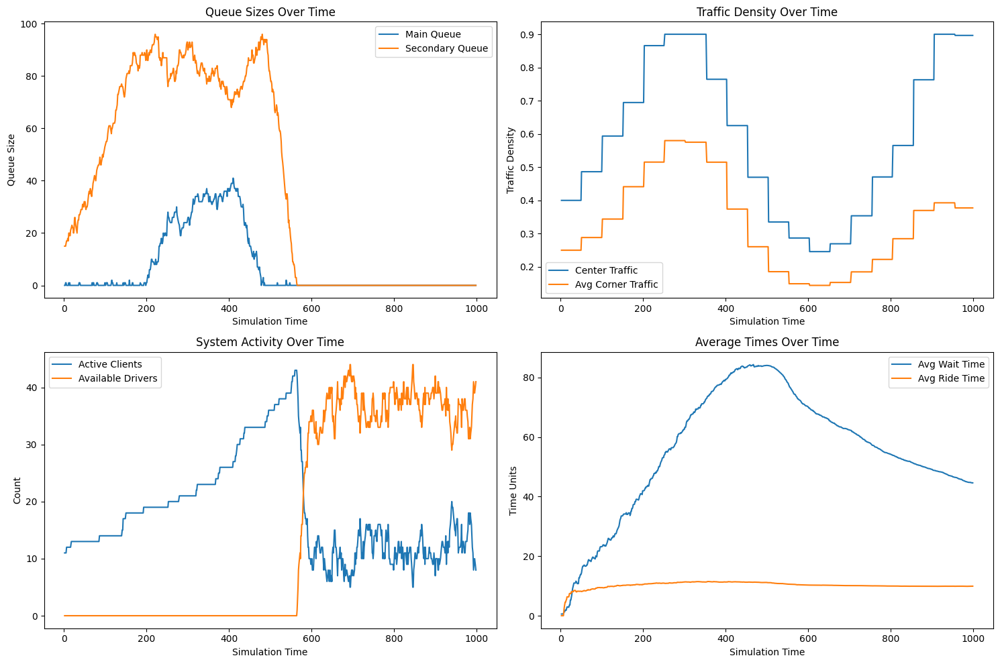

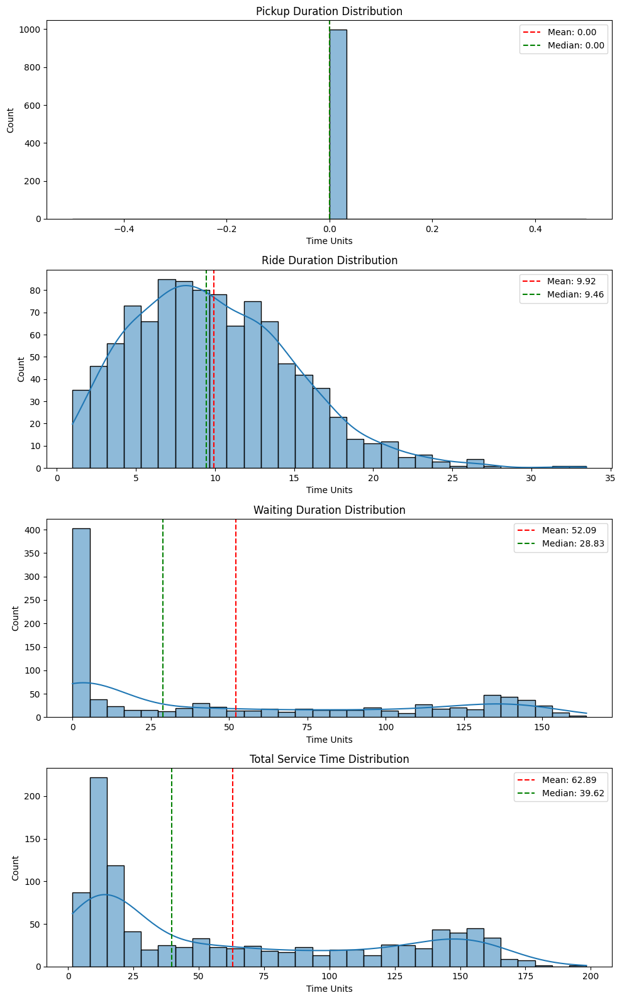

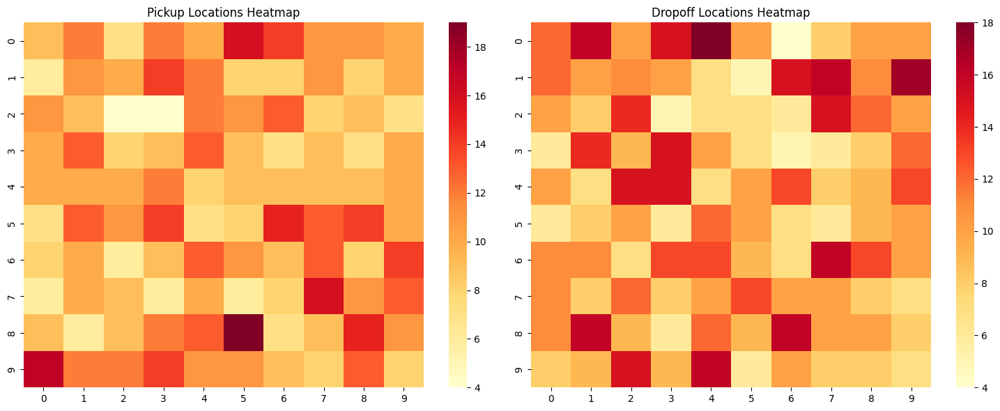

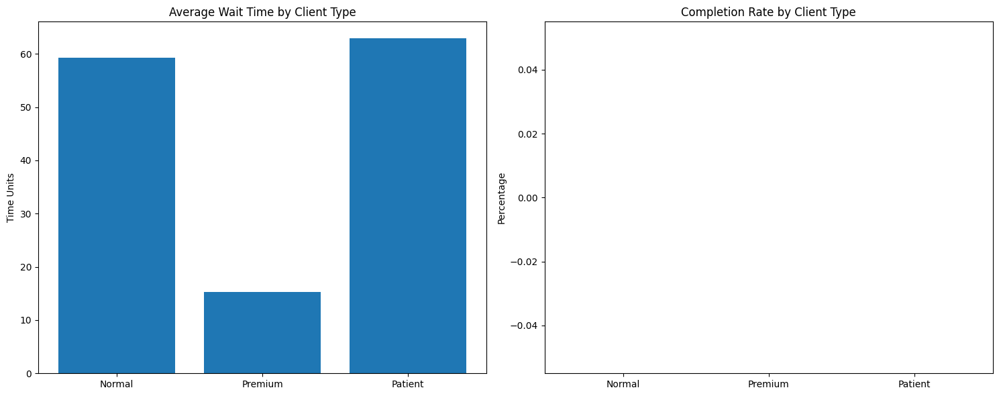

In [ ]:
# First create the map and network as before
my_map = city_map((10, 10), num_hotspots=4)
my_network = uber_network(
    city_map=my_map,
    client_arrival_rate=0.5,
    driver_arrival_rate=0.08,
    pre_simulation_driver=10,
    simulation_time=1000
)

# Pre-load some clients into queues before starting simulation
num_initial_clients = 25  # Adjust this number as needed

# Generate and add initial clients
for _ in range(num_initial_clients):
    # Create new client at time 0
    new_client = uber_client.generate_client(my_map, current_time=0)
    
    # Add to appropriate queue based on client type
    if new_client.behaviour_type == "Premium":
        my_network.main_queue.put(new_client)
    else:
        my_network.secondary_queue.put(new_client)
    
    # Update network stats
    my_network.stats['total_clients'] += 1

# Now run simulation and plot
data, time_points, analysis = run_and_plot_simulation(my_network)